In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, InputLayer, BatchNormalization, MaxPool2D, Layer, GlobalAveragePooling2D, Add, Dense, Activation
from tensorflow.keras.models import Model

In [ ]:
working_direc = '/content/drive/MyDrive/Human-Emotion-Detection/'
train_direc = working_direc +'Emotions Dataset/train'
val_direc = working_direc +'Emotions Dataset/test'
CLASS_NAMES = ["angry", "happy", "sad"]

CONFIGURATIONS = {
    'BATCH_SIZE':32,
    'IM_SIZE': 256,
    'LEARNING_RATE': 0.001,
    'N_EPOCH': 30,
    'N_DENSE_1': 1024,
    'N_DENSE_2': 128,
    'NUM_CLASSES':3
}

In [ ]:
train_dataset = tf.keras.utils.image_dataset_from_directory(
    train_direc,
    labels = 'inferred',
    label_mode ='categorical',
    class_names=CLASS_NAMES,
    color_mode='rgb',
    batch_size =CONFIGURATIONS['BATCH_SIZE'],
    image_size =(CONFIGURATIONS['IM_SIZE'], CONFIGURATIONS['IM_SIZE']),
    shuffle = True,
    seed =99
)

Found 6799 files belonging to 3 classes.


In [ ]:
val_dataset = tf.keras.utils.image_dataset_from_directory(
    val_direc,
    labels = 'inferred',
    label_mode ='categorical',
    class_names=CLASS_NAMES,
    color_mode='rgb',
    batch_size =CONFIGURATIONS['BATCH_SIZE'],
    image_size =(CONFIGURATIONS['IM_SIZE'], CONFIGURATIONS['IM_SIZE']),
    shuffle = True,
    seed =99
)

Found 2278 files belonging to 3 classes.


In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

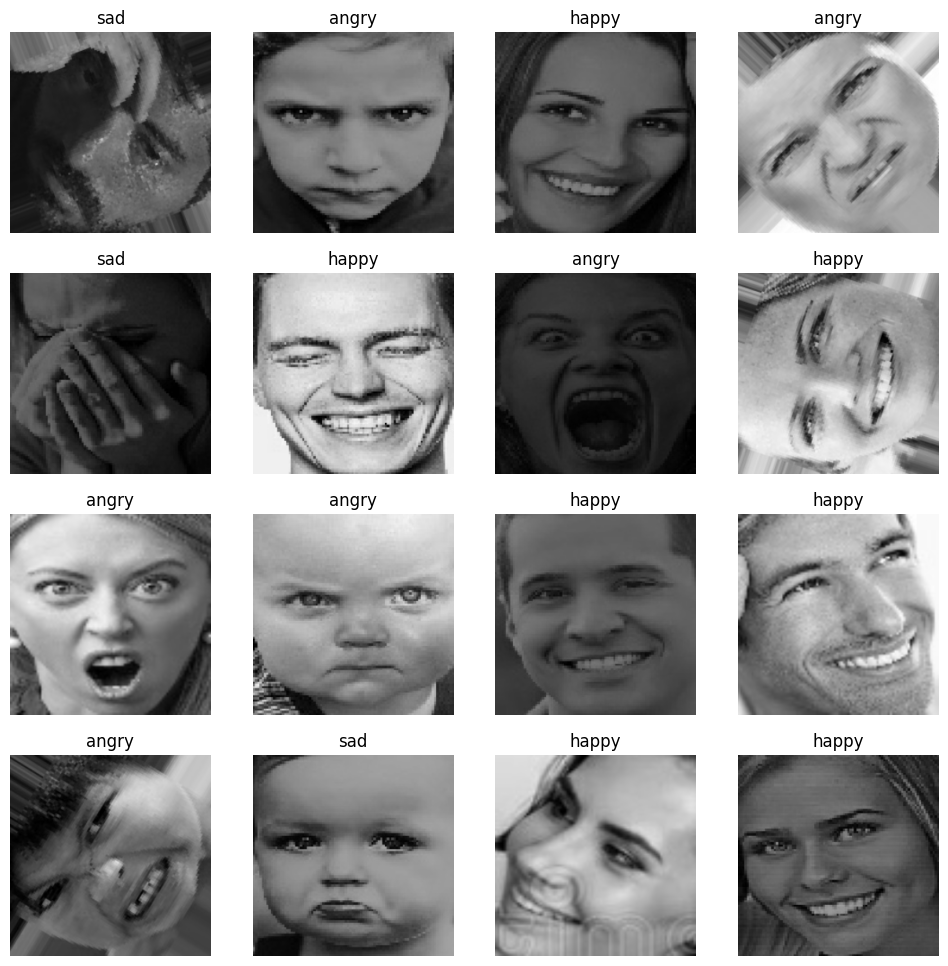

In [ ]:
plt.figure(figsize =(12,12))

for images, labels in train_dataset.take(1):
  for i in range(16):
    ax = plt.subplot(4,4, i+1)
    plt.imshow(images[i]/255.0)
    plt.title(CLASS_NAMES[tf.argmax(labels.numpy()[i])])
    plt.axis('off')

In [ ]:
# Data Augmentation

from tensorflow.keras.layers import RandomFlip, RandomRotation, RandomContrast

augment_layers = tf.keras.Sequential([
    RandomRotation(factor = (-0.025, 0.025)),
    RandomFlip(mode='horizontal'),
    RandomContrast(factor=0.1)
    ]
)

def augment_layer(image, label):
  return augment_layers(image, training=True), label

In [ ]:
training_dataset = (train_dataset
                    .map(augment_layer, num_parallel_calls = tf.data.AUTOTUNE)
                    .prefetch(tf.data.AUTOTUNE))
validation_dataset = val_dataset.prefetch(tf.data.AUTOTUNE)

In [ ]:
from tensorflow.keras.layers import Rescaling, Resizing
from tensorflow.keras.layers import Input, GlobalAveragePooling2D, Dense, BatchNormalization

resize_rescale_layers = tf.keras.Sequential([
    Resizing(CONFIGURATIONS['IM_SIZE'], CONFIGURATIONS['IM_SIZE']),
    Rescaling(1.0/255.0)
])

### ResNet50

In [ ]:
class CustomConv2D(Layer):
  def __init__(self, n_filters, kernelsize, n_strides, n_padding='same'):
    super(CustomConv2D, self).__init__(name = 'Custom_Conv2D')

    self.conv = Conv2D(filters = n_filters, kernel_size = kernelsize, strides = n_strides, padding = n_padding)
    self.BN = BatchNormalization()

  def call(self, x, training=True):
    x = self.conv(x)
    x = self.BN(x, training = training)
    return x

In [ ]:
class ResidualBlock(Layer):
  def __init__(self, n_channels, n_strides =1):
    super(ResidualBlock, self).__init__()

    self.dotted = n_strides !=1
    self.conv_1 = CustomConv2D(n_channels, 1, n_strides)
    self.conv_2 = CustomConv2D(n_channels, 3, 1)
    self.conv_3 = CustomConv2D(n_channels * 4, 1, 1)
    self.activation = Activation('relu')

    self.conv_4 = CustomConv2D(n_channels *4, 1, n_strides)


  def call(self, input, training=True):
      x = self.conv_1(input, training)
      x = self.conv_2(x, training)
      x = self.conv_3(x, training)

      x_res_conn = self.conv_4(input, training)
      x_res_conn = Add()([x, x_res_conn])

      return self.activation(x_res_conn)

In [ ]:
from os import name
class ResNet50(Model):
  def __init__(self,):
    super(ResNet50, self).__init__(name = 'Custom_ResNet50')

    self.conv1_x = tf.keras.Sequential([
        Conv2D(filters = 64, kernel_size = 7, strides =2, activation ='relu'),
        MaxPool2D(pool_size=(3,3), strides=2)
        ], name='Conv_1')
    self.conv2_x = tf.keras.Sequential([
        ResidualBlock(64), ResidualBlock(64), ResidualBlock(64)
        ], name='Conv_2')
    self.conv3_x = tf.keras.Sequential([
        ResidualBlock(128, 2), ResidualBlock(128), ResidualBlock(128), ResidualBlock(128)
        ], name='Conv_3')
    self.conv4_x = tf.keras.Sequential([
        ResidualBlock(256, 2), ResidualBlock(256), ResidualBlock(256), ResidualBlock(256), ResidualBlock(256), ResidualBlock(256)
        ], name='Conv_4')
    self.conv5_x = tf.keras.Sequential([
        ResidualBlock(512, 2), ResidualBlock(512), ResidualBlock(512)
        ], name='Conv_5')
    self.avg_pool = GlobalAveragePooling2D(name='Avg_Pool')
    self.FC_1 = Dense(100, activation='relu', name='FC_1')
    self.FC_2 = Dense(CONFIGURATIONS['NUM_CLASSES'], activation='softmax', name ='FC_2')

  def call(self, x, training =True):
    x = self.conv1_x(x, training)
    x = self.conv2_x(x, training)
    x = self.conv3_x(x, training)
    x = self.conv4_x(x, training)
    x = self.conv5_x(x, training)
    x = self.avg_pool(x)
    x = self.FC_1(x)
    x = self.FC_2(x)

    return x

In [ ]:
ResNet50_Model = ResNet50()

In [ ]:
ResNet50_Model(tf.zeros([1,224,224,3]), training = False)

<tf.Tensor: shape=(1, 3), dtype=float32, numpy=array([[0.33333334, 0.33333334, 0.33333334]], dtype=float32)>

In [ ]:
ResNet50_Model.summary()

Model: "Custom_ResNet50"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Conv_1 (Sequential)         (1, 54, 54, 64)           9472      
                                                                 
 Conv_2 (Sequential)         (1, 54, 54, 256)          353664    
                                                                 
 Conv_3 (Sequential)         (1, 27, 27, 512)          2024448   
                                                                 
 Conv_4 (Sequential)         (1, 14, 14, 1024)         12397568  
                                                                 
 Conv_5 (Sequential)         (1, 7, 7, 2048)           23407616  
                                                                 
 Avg_Pool (GlobalAveragePoo  multiple                  0         
 ling2D)                                                         
                                                   

### Training and Optimization

In [ ]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.metrics import Precision, Recall, F1Score, AUC, CategoricalAccuracy, TopKCategoricalAccuracy
from tensorflow.keras.callbacks import CSVLogger, EarlyStopping, LearningRateScheduler, ModelCheckpoint, ReduceLROnPlateau

In [ ]:
METRICS = [Precision(name ='precision'), Recall(name ='recall'), AUC(name ='auc'), CategoricalAccuracy(name ='accuracy'),
           TopKCategoricalAccuracy(k=2, name ='topk_accuracy')]

loss_function = CategoricalCrossentropy()

In [ ]:
ResNet50_Model.compile(optimizer=Adam(learning_rate=CONFIGURATIONS['LEARNING_RATE']), loss=loss_function, metrics = METRICS)

In [ ]:
# csv logger
working_direc = working_direc + 'ResNet50/'
path = working_direc + 'ResNet_model_logs.csv'
csv_callback = CSVLogger(path, separator = ',', append = True)

# tensorboard callback
import datetime
current_time = datetime.datetime.now().strftime('%d%m%y - %h%m%s')

LOG_DIR = working_direc + 'logs/' + current_time
METRIC_DIR = LOG_DIR + '/metrics'
train_writer = tf.summary.create_file_writer(METRIC_DIR)

tensorboard_Callback = tf.keras.callbacks.TensorBoard(log_dir = LOG_DIR)

# early stopping
es_callback = EarlyStopping(
    monitor = 'val_loss',
    min_delta = 0,
    patience = 10,
    verbose = 1,
    mode = 'auto',
    restore_best_weights = True
)


# learning rate scheduling
def scheduler(epoch, lr):

  if epoch <= 10:
    learning_rate = lr
  else:
    learning_rate = lr * tf.math.exp(-0.1)
    learning_rate = learning_rate.numpy()

  with train_writer.as_default():
    tf.summary.scalar('Learning Rate', data = learning_rate, step = epoch)
  return learning_rate
scheduler_callback = LearningRateScheduler(scheduler, verbose = 1)

# reduce learning rate on plateau
plateau_callback = ReduceLROnPlateau(
    monitor = 'val_accuracy', factor =0.1, patience =5, verbose =1
)

# model checkpointing
location = working_direc + 'model_checkpoint/'
checkpoint_callback = ModelCheckpoint(
    location,
    monitor = 'val_loss',
    verbose=1,
    save_best_only=True,
    save_weights_only=False,
    mode ='auto',
    save_freq='epoch'
)

In [ ]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '/device:GPU:0'

In [ ]:
model_training = ResNet50_Model.fit(training_dataset, validation_data=validation_dataset, epochs=CONFIGURATIONS['N_EPOCH'], verbose=1
                               ,callbacks=[tensorboard_Callback, csv_callback, es_callback, scheduler_callback, checkpoint_callback, plateau_callback])


Epoch 1: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 1/30
213/213 [==============================] - ETA: 0s - loss: 1.0932 - precision: 0.5300 - recall: 0.2275 - auc: 0.6374 - accuracy: 0.4618 - topk_accuracy: 0.7828
Epoch 1: val_loss improved from inf to 3.27332, saving model to /content/drive/MyDrive/Human-Emotion-Detection/ResNet50/model_checkpoint/
213/213 [==============================] - 695s 3s/step - loss: 1.0932 - precision: 0.5300 - recall: 0.2275 - auc: 0.6374 - accuracy: 0.4618 - topk_accuracy: 0.7828 - val_loss: 3.2733 - val_precision: 0.4544 - val_recall: 0.3415 - val_auc: 0.5855 - val_accuracy: 0.4381 - val_topk_accuracy: 0.7015 - lr: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 2/30
213/213 [==============================] - ETA: 0s - loss: 0.9975 - precision: 0.6057 - recall: 0.2886 - auc: 0.6945 - accuracy: 0.5104 - topk_accuracy: 0.8163
Epoch 2: val_loss did not improve from 3.27332
21

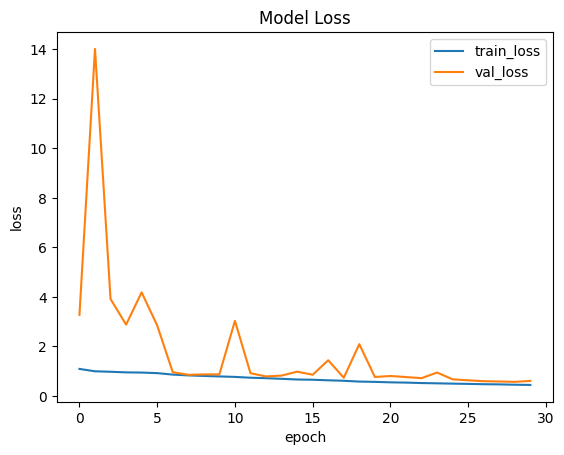

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.plot(model_training.history['loss'])
plt.plot(model_training.history['val_loss'])
plt.xlabel('epoch')
plt.ylabel('loss')
plt.title('Model Loss')
plt.legend(['train_loss', 'val_loss'])

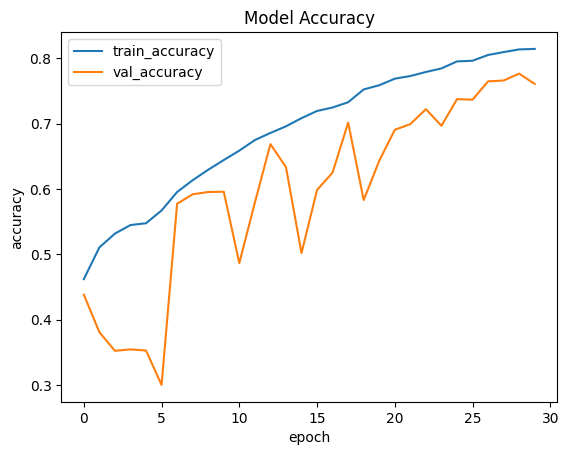

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.plot(model_training.history['accuracy'])
plt.plot(model_training.history['val_accuracy'])
plt.xlabel('epoch')
plt.ylabel('accuracy')
plt.title('Model Accuracy')
plt.legend(['train_accuracy', 'val_accuracy'])

In [ ]:
save_model_path = working_direc + 'ResNet_Model_seq.keras'
ResNet50_Model.save(save_model_path)

In [ ]:
%load_ext tensorboard

In [ ]:
tensorboard --logdir=/content/drive/MyDrive/Human-Emotion-Detection/ResNet50/logs/

<IPython.core.display.Javascript object>

### Evaluation and Testing

In [ ]:
ResNet50_Model.evaluate(validation_dataset)

72/72 [==============================] - 16s 204ms/step - loss: 0.6095 - precision: 0.7984 - recall: 0.7217 - auc: 0.9121 - accuracy: 0.7608 - topk_accuracy: 0.9087


[0.6095104217529297,
 0.7984458208084106,
 0.7216857075691223,
 0.9120962023735046,
 0.7607550621032715,
 0.9086918234825134]

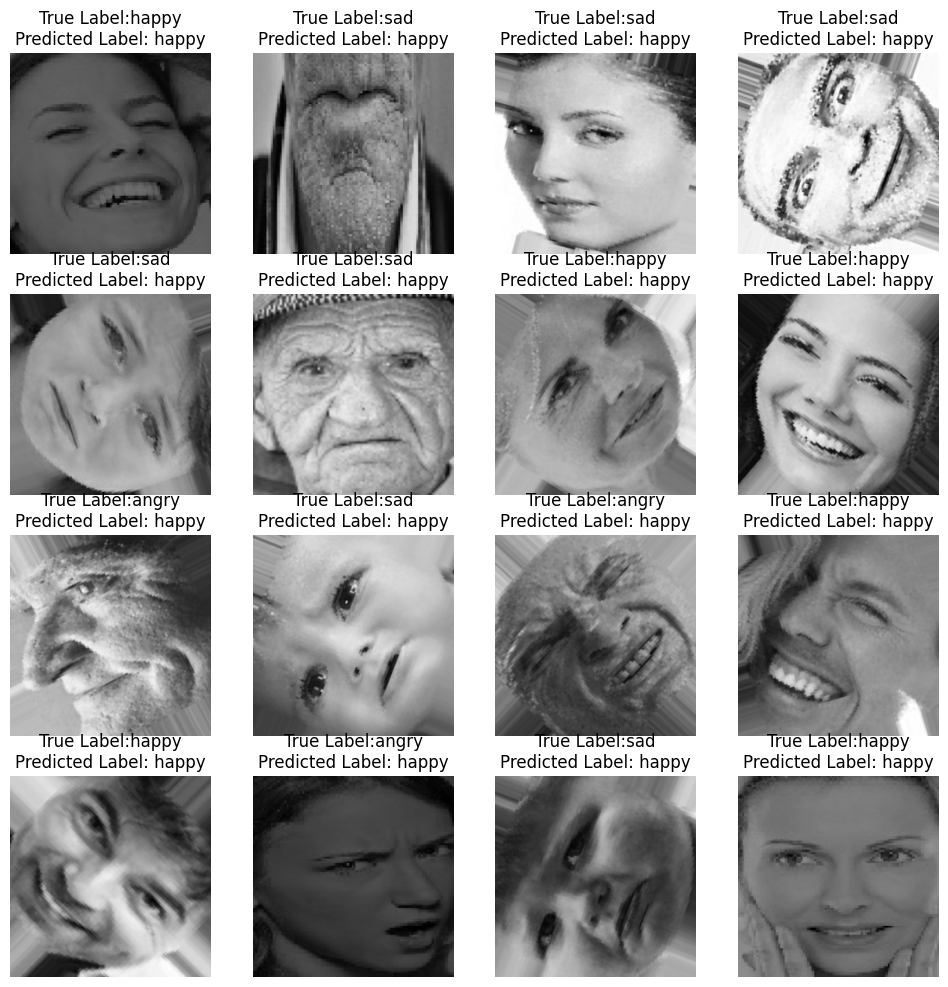

In [ ]:
plt.figure(figsize =(12,12))

for images, labels in validation_dataset.take(1):
  for i in range(16):
    ax = plt.subplot(4,4, i+1)
    plt.imshow(images[i]/255.0)
    plt.title('True Label:' + CLASS_NAMES[tf.argmax(labels.numpy()[i])] + '\n' +
              'Predicted Label: ' + CLASS_NAMES[tf.argmax(ResNet50_Model(tf.expand_dims(images[i], axis =0)), axis =-1).numpy()[0]])
    plt.axis('off')

#### Metrics

In [ ]:
import numpy as np
predictions = []
labels = []

for im, label in validation_dataset:
  predictions.append(ResNet50_Model(im))
  labels.append(label.numpy())

preds = np.concatenate([np.argmax(predictions[:-1], axis = -1).flatten(), np.argmax(predictions[-1], axis = -1).flatten()])
true_labels = np.concatenate([np.argmax(labels[:-1], axis = -1).flatten(), np.argmax(predictions[-1], axis = -1).flatten()])

[[315  67 132]
 [ 30 859 117]
 [ 74  66 618]]


Text(0.5, 14.722222222222216, 'Predicted')

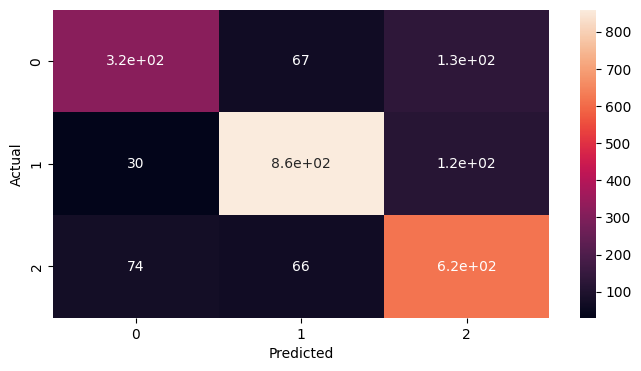

In [ ]:
# confusion matrix
from sklearn.metrics import confusion_matrix, f1_score
import seaborn as sns

conf = confusion_matrix(true_labels, preds)

print(conf)

plt.figure(figsize = (8,4))
sns.heatmap(conf, annot=True)
plt.ylabel('Actual')
plt.xlabel('Predicted')

In [ ]:
f1_score(true_labels, preds, average='micro')

0.7866549604916594

### Pre-trained ResNet50

In [ ]:
ResNet50_PT = tf.keras.applications.resnet50.ResNet50(
    include_top=False,
    weights='imagenet',
    input_shape=(CONFIGURATIONS['IM_SIZE'], CONFIGURATIONS['IM_SIZE'],3)
)

In [ ]:
ResNet50_PT.trainable = False

In [ ]:
ResNet50_PT_Model = tf.keras.Sequential([
    Input(shape = (CONFIGURATIONS['IM_SIZE'], CONFIGURATIONS['IM_SIZE'],3)),
    ResNet50_PT,
    GlobalAveragePooling2D(),
    Dense(CONFIGURATIONS['N_DENSE_1'], activation = 'relu'),
    BatchNormalization(),
    Dense(CONFIGURATIONS['N_DENSE_2'], activation ='relu'),
    Dense(CONFIGURATIONS['NUM_CLASSES'], activation ='softmax')
])

In [ ]:
ResNet50_PT_Model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 8, 8, 2048)        23587712  
                                                                 
 global_average_pooling2d (  (None, 2048)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense (Dense)               (None, 1024)              2098176   
                                                                 
 batch_normalization (Batch  (None, 1024)              4096      
 Normalization)                                                  
                                                                 
 dense_1 (Dense)             (None, 128)               131200    
                                                                 
 dense_2 (Dense)             (None, 3)                

In [ ]:
METRICS = [Precision(name ='precision'), Recall(name ='recall'), AUC(name ='auc'), CategoricalAccuracy(name ='accuracy'),
           TopKCategoricalAccuracy(k=2, name ='topk_accuracy')]

loss_function = CategoricalCrossentropy()

In [ ]:
ResNet50_PT_Model.compile(optimizer=Adam(learning_rate=CONFIGURATIONS['LEARNING_RATE']), loss=loss_function, metrics = METRICS)

In [ ]:
# csv logger
working_direc = working_direc + 'ResNet50_PT/'
path = working_direc + 'ResNet_PT_model_logs.csv'
csv_callback = CSVLogger(path, separator = ',', append = True)

# tensorboard callback
import datetime
current_time = datetime.datetime.now().strftime('%d%m%y - %h%m%s')

LOG_DIR = working_direc + 'logs/' + current_time
METRIC_DIR = LOG_DIR + '/metrics'
train_writer = tf.summary.create_file_writer(METRIC_DIR)

tensorboard_Callback = tf.keras.callbacks.TensorBoard(log_dir = LOG_DIR)

# early stopping
es_callback = EarlyStopping(
    monitor = 'val_loss',
    min_delta = 0,
    patience = 10,
    verbose = 1,
    mode = 'auto',
    restore_best_weights = True
)


# learning rate scheduling
def scheduler(epoch, lr):

  if epoch <= 10:
    learning_rate = lr
  else:
    learning_rate = lr * tf.math.exp(-0.1)
    learning_rate = learning_rate.numpy()

  with train_writer.as_default():
    tf.summary.scalar('Learning Rate', data = learning_rate, step = epoch)
  return learning_rate
scheduler_callback = LearningRateScheduler(scheduler, verbose = 1)

# reduce learning rate on plateau
plateau_callback = ReduceLROnPlateau(
    monitor = 'val_accuracy', factor =0.1, patience =5, verbose =1
)

# model checkpointing
location = working_direc + 'model_checkpoint/'
checkpoint_callback = ModelCheckpoint(
    location,
    monitor = 'val_loss',
    verbose=1,
    save_best_only=True,
    save_weights_only=False,
    mode ='auto',
    save_freq='epoch'
)

In [ ]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '/device:GPU:0'

In [ ]:
model_training = ResNet50_PT_Model.fit(training_dataset, validation_data=validation_dataset, epochs=CONFIGURATIONS['N_EPOCH'], verbose=1
                               ,callbacks=[tensorboard_Callback, csv_callback, es_callback, scheduler_callback, checkpoint_callback, plateau_callback])


Epoch 1: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 1/30
213/213 [==============================] - ETA: 0s - loss: 0.8132 - precision: 0.7035 - recall: 0.6392 - auc: 0.8504 - accuracy: 0.6750 - topk_accuracy: 0.8941
Epoch 1: val_loss improved from inf to 0.61838, saving model to /content/drive/MyDrive/Human-Emotion-Detection/ResNet50_PT/model_checkpoint/
213/213 [==============================] - 2464s 12s/step - loss: 0.8132 - precision: 0.7035 - recall: 0.6392 - auc: 0.8504 - accuracy: 0.6750 - topk_accuracy: 0.8941 - val_loss: 0.6184 - val_precision: 0.7794 - val_recall: 0.7195 - val_auc: 0.9043 - val_accuracy: 0.7529 - val_topk_accuracy: 0.9219 - lr: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 2/30
213/213 [==============================] - ETA: 0s - loss: 0.5679 - precision: 0.8005 - recall: 0.7282 - auc: 0.9169 - accuracy: 0.7673 - topk_accuracy: 0.9340
Epoch 2: val_loss did not improve from 0.618

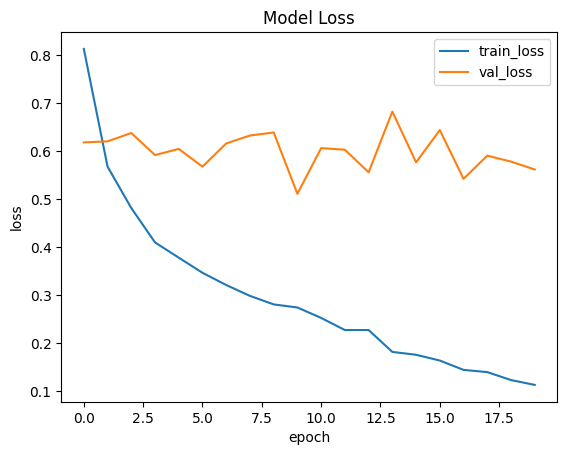

In [ ]:
plt.plot(model_training.history['loss'])
plt.plot(model_training.history['val_loss'])
plt.xlabel('epoch')
plt.ylabel('loss')
plt.title('Model Loss')
plt.legend(['train_loss', 'val_loss'])

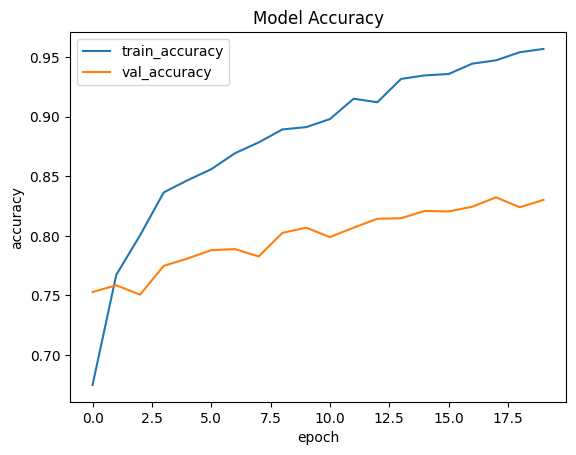

In [ ]:
plt.plot(model_training.history['accuracy'])
plt.plot(model_training.history['val_accuracy'])
plt.xlabel('epoch')
plt.ylabel('accuracy')
plt.title('Model Accuracy')
plt.legend(['train_accuracy', 'val_accuracy'])

In [ ]:
save_model_path = working_direc + 'ResNet50_PT_Model.keras'
ResNet50_PT_Model.save(save_model_path)

In [ ]:
%load_ext tensorboard

In [ ]:
tensorboard --logdir=/content/drive/MyDrive/Human-Emotion-Detection/ResNet50_PT/logs/

<IPython.core.display.Javascript object>

In [ ]:
ResNet50_PT_Model.evaluate(validation_dataset)

72/72 [==============================] - 11s 136ms/step - loss: 0.5113 - precision: 0.8239 - recall: 0.7946 - auc: 0.9424 - accuracy: 0.8068 - topk_accuracy: 0.9460


[0.5113187432289124,
 0.823850691318512,
 0.7945566177368164,
 0.9424148201942444,
 0.8068481087684631,
 0.9460052847862244]

In [ ]:
import numpy as np
predictions = []
labels = []

for im, label in validation_dataset:
  predictions.append(ResNet50_PT_Model(im))
  labels.append(label.numpy())

preds = np.concatenate([np.argmax(predictions[:-1], axis = -1).flatten(), np.argmax(predictions[-1], axis = -1).flatten()])
true_labels = np.concatenate([np.argmax(labels[:-1], axis = -1).flatten(), np.argmax(predictions[-1], axis = -1).flatten()])

[[346  68  99]
 [ 45 879  83]
 [ 62  81 615]]


Text(0.5, 14.722222222222216, 'Predicted')

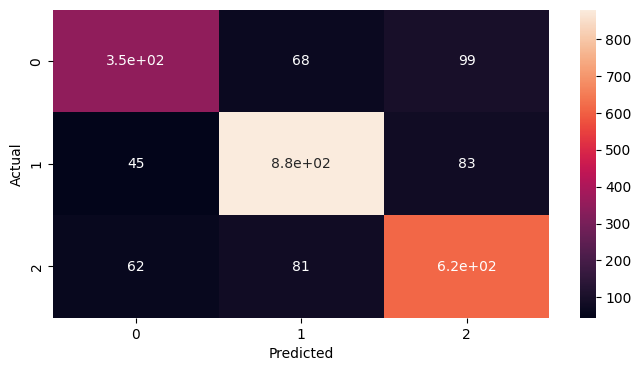

In [ ]:
# confusion matrix
from sklearn.metrics import confusion_matrix, f1_score
import seaborn as sns
conf = confusion_matrix(true_labels, preds)

print(conf)

plt.figure(figsize = (8,4))
sns.heatmap(conf, annot=True)
plt.ylabel('Actual')
plt.xlabel('Predicted')

In [ ]:
f1_score(true_labels, preds, average='micro')

0.8077260755048288